In [79]:
## Mathmatics libraries
import numpy as np

import os

## Visual and plotting libraries
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
from itertools import product

import pickle

In [2]:
with open(os.path.join('Training_raw_images/20210416.RAW'), 'r') as infile: 
    data = np.fromfile(infile, dtype=np.uint8, count=-1) 

In [3]:
data.shape

(3146762,)

3,146,762 bytes

In [6]:
nrows = int(''.join(map(lambda x: np.binary_repr(x, 8), data[8:9+1][::-1])), 2)
ncols = int(''.join(map(lambda x: np.binary_repr(x, 8), data[6:7+1][::-1])), 2)
image_size = nrows * ncols

In [10]:
image = data[10:image_size+10].reshape((nrows, ncols))
image.size

3145728

In [11]:
image_size

3145728

In [12]:
for i, j in product((0, 1), (0, 1)):
    print(f'{i, j} {image[i::2,j::2].mean():.0f} ± {image[i::2,j::2].std():.0f}')

(0, 0) 69 ± 24
(0, 1) 59 ± 19
(1, 0) 75 ± 30
(1, 1) 68 ± 24


<AxesSubplot:>

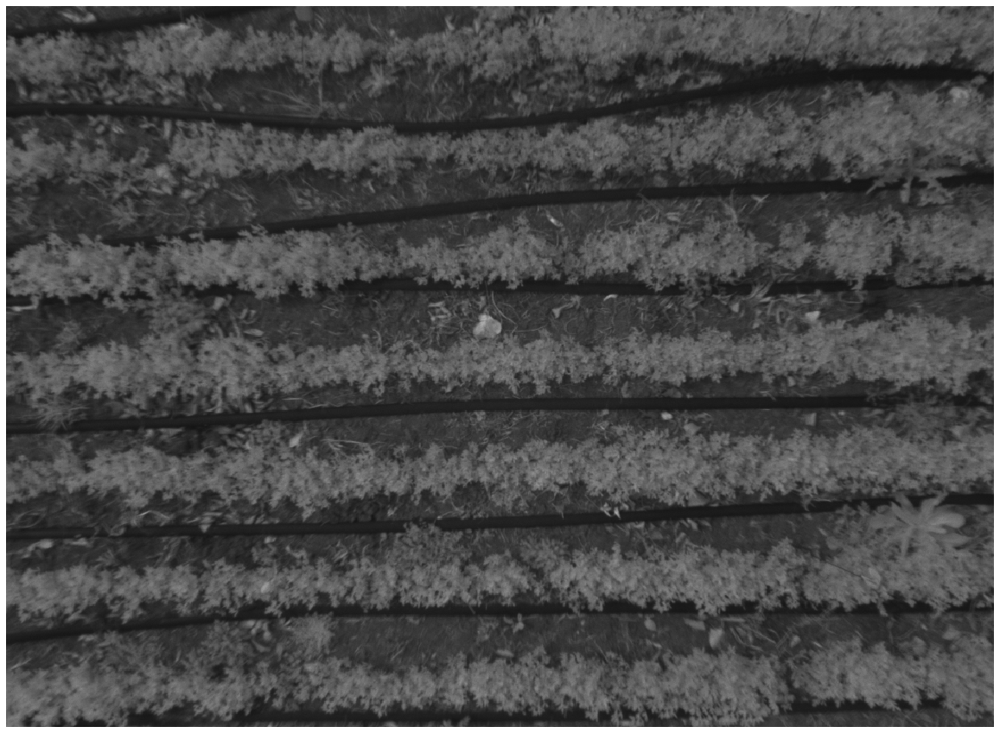

In [13]:
fig, ax = plt.subplots(figsize=(ncols/100, nrows/100))
B00 = image[0::2,0::2]
sns.heatmap(B00, cmap='binary_r', ax=ax, cbar=False, yticklabels=False, xticklabels=False, vmin=0, vmax=255)

<AxesSubplot:>

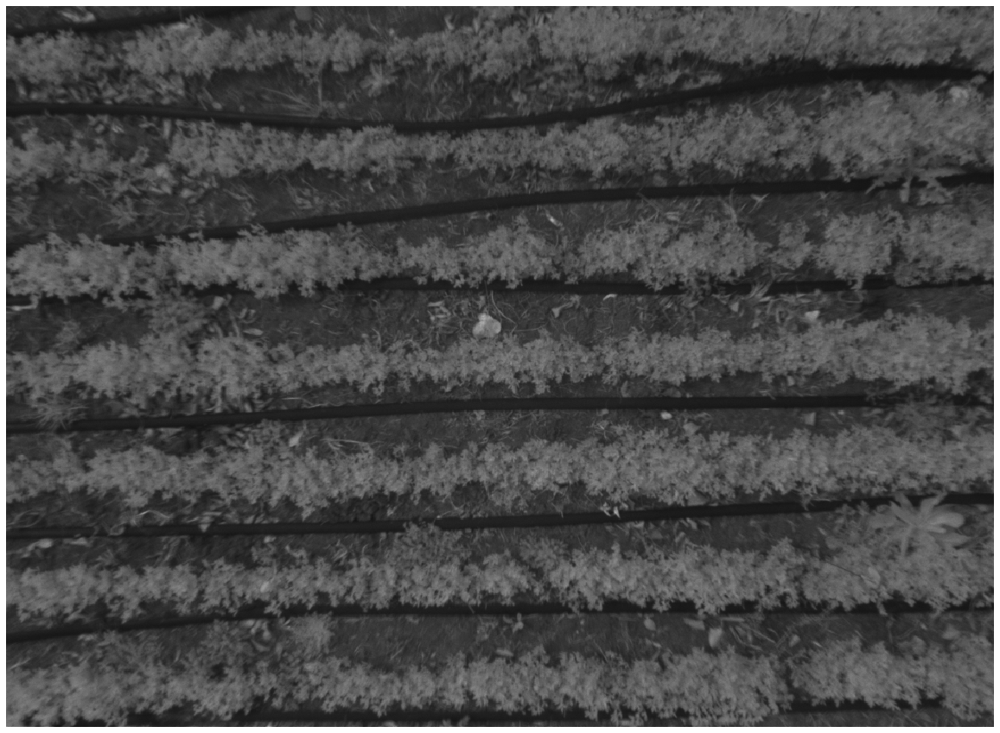

In [14]:
fig, ax = plt.subplots(figsize=(ncols/100, nrows/100))
B11 = image[1::2, 1::2]
sns.heatmap(B11, cmap='binary_r', ax=ax, cbar=False, yticklabels=False, xticklabels=False, vmin=0, vmax=255)

<AxesSubplot:>

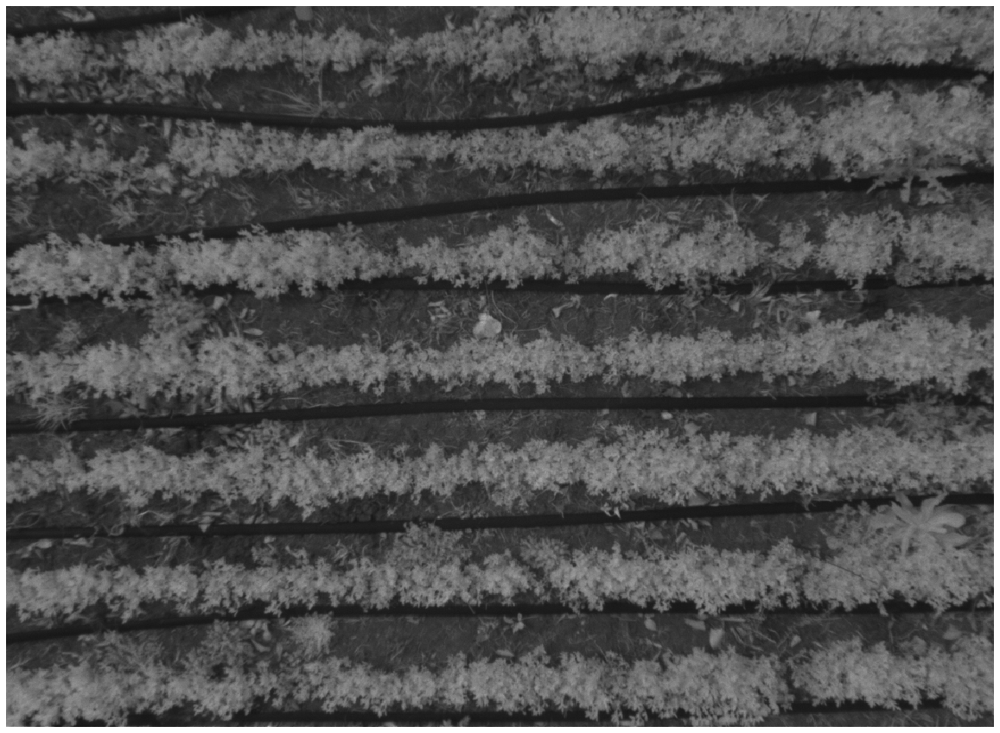

In [15]:
fig, ax = plt.subplots(figsize=(ncols/100, nrows/100))
B10 = image[1::2, 0::2]
sns.heatmap(B10, cmap='binary_r', ax=ax, cbar=False, yticklabels=False, xticklabels=False, vmin=0, vmax=255)

<AxesSubplot:>

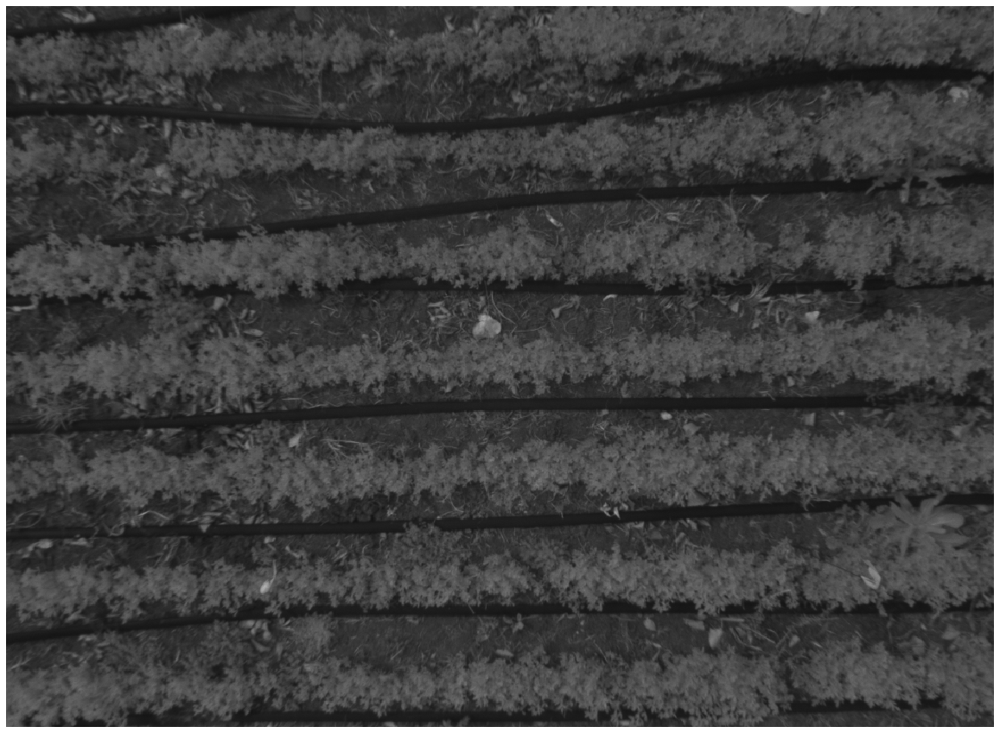

In [16]:
fig, ax = plt.subplots(figsize=(ncols/100, nrows/100))
B01 = image[0::2, 1::2]
sns.heatmap(B01, cmap='binary_r', ax=ax, cbar=False, yticklabels=False, xticklabels=False, vmin=0, vmax=255)

<AxesSubplot:>

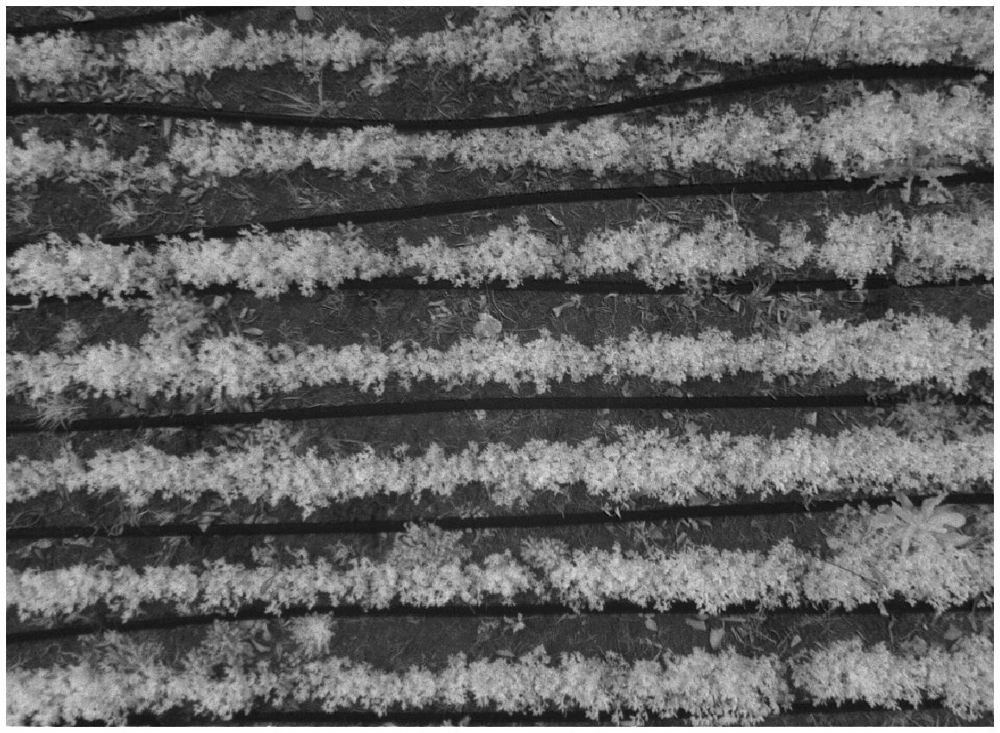

In [17]:
RB = (-0.89*B01 -0.89*np.mean([B11, B00], axis=0) + 2.78*B10)*.99
RB = np.where(RB > 255, 255, np.where(RB<0, 0, RB))
fig, ax = plt.subplots(figsize=(ncols/100, nrows/100))
sns.heatmap(RB, cmap='binary_r', ax=ax, cbar=False, yticklabels=False, xticklabels=False, vmin=0, vmax=255)

<AxesSubplot:>

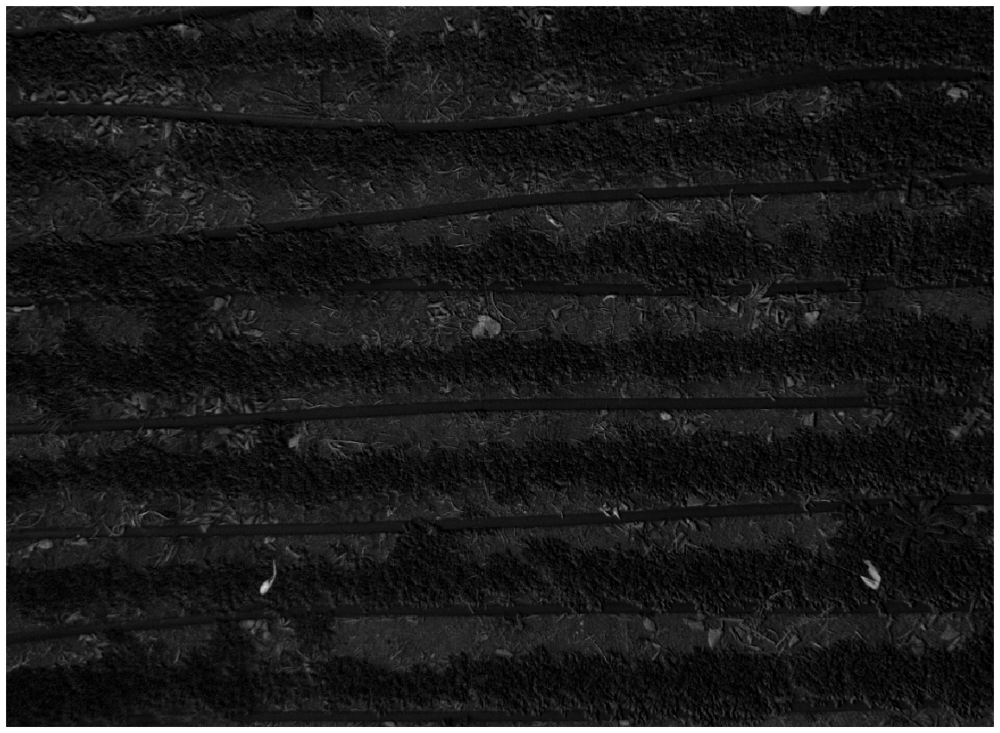

In [18]:
GB = (3.68*B01 - 1.34*np.mean([B11, B00], axis=0) - 1.34*B10)*0.87
GB = np.where(GB > 255, 255, np.where(GB<0, 0, GB))
fig, ax = plt.subplots(figsize=(ncols/100, nrows/100))
sns.heatmap(GB, cmap='binary_r', ax=ax, cbar=False, yticklabels=False, xticklabels=False, vmin=0, vmax=255)

<AxesSubplot:>

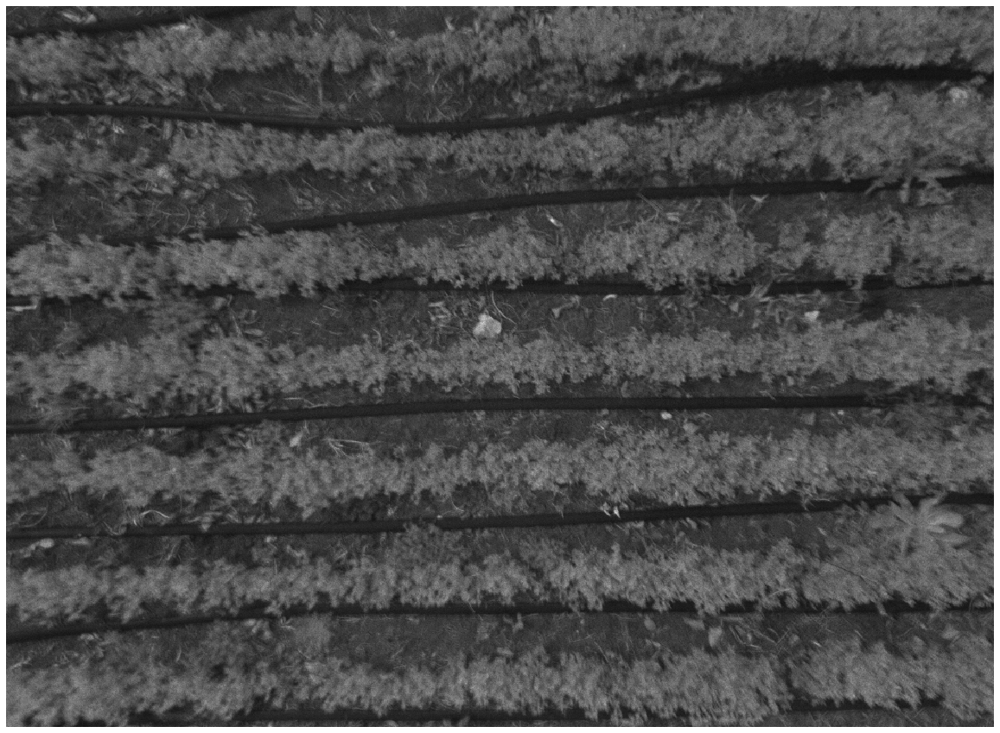

In [19]:
BB = (-1.33*B01 + 3.66*np.mean([B11, B00], axis=0) - 1.33*B10)*1.
BB = np.where(BB > 255, 255, np.where(BB<0, 0, BB))
fig, ax = plt.subplots(figsize=(ncols/100, nrows/100))
sns.heatmap(BB, cmap='binary_r', ax=ax, cbar=False, yticklabels=False, xticklabels=False, vmin=0, vmax=255)

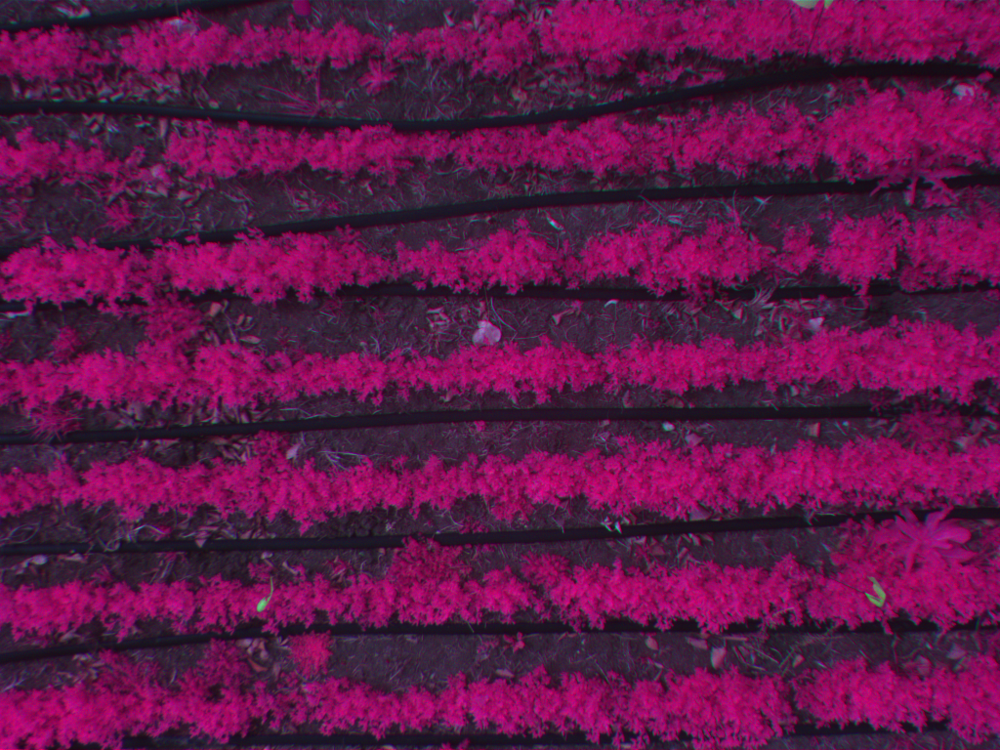

In [20]:
rgb_uint8 = (np.dstack((RB,GB,BB))).astype(np.uint8)
Image.fromarray(rgb_uint8)

In [21]:
def create_image(image_path, cpf_matrix):
    with open(image_path, 'r') as infile: 
        data = np.fromfile(infile, dtype=np.uint8, count=-1)
        
    nrows = int(''.join(map(lambda x: np.binary_repr(x, 8), data[8:9+1][::-1])), 2)
    ncols = int(''.join(map(lambda x: np.binary_repr(x, 8), data[6:7+1][::-1])), 2)
    image_size = nrows * ncols
    image = data[10:image_size+10].reshape((nrows, ncols))
    B = {}
    for i, j in product((0, 1), (0, 1)): B[f'{i}{j}'] = image[i::2,j::2] #GRBG
    RGBBands = {}
    for band, Rf, Gf, Bf, Scale in cpf_matrix:
        RGBBands[band] = (Rf*B['01'] + Gf*np.mean([B['11'], B['00']], axis=0) + Bf*B['10'])*Scale
        RGBBands[band] = np.where(RGBBands[band] > 255, 255, np.where(RGBBands[band]<0, 0, RGBBands[band]))
    Image_array = (np.dstack((RGBBands['R'],RGBBands['G'],RGBBands['B']))).astype(np.uint8)
    return Image_array

In [22]:
images = {}
image_ref = {}
cal_plate = {}

Text(0.5, 1.0, 'Plot false color composite')

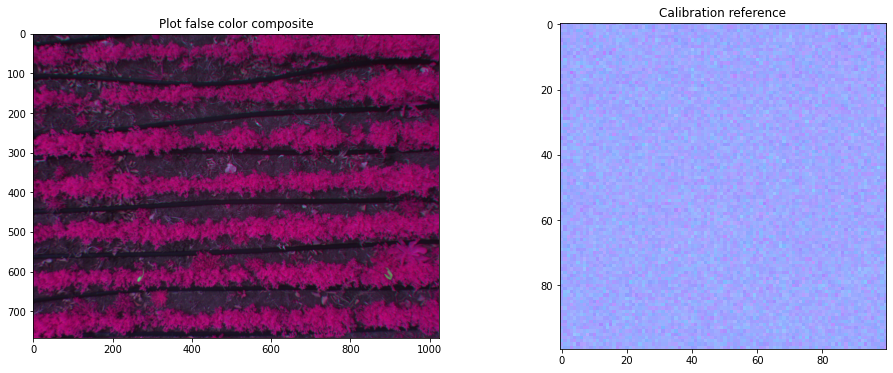

In [23]:
matrix = [
    ['R', -.88, -.88, 2.76, .95],
    ['G', 3.74, -1.37, -1.37, .85],
    ['B', -1.32, 3.64, -1.32, 1.]
]
images['20210416'] = create_image('Training_raw_images/20210416.RAW', matrix)
cal_plate['20210416'] = create_image('Training_raw_images/20210416_cal.RAW', matrix)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax.flatten()
ax[0].imshow(Image.fromarray(images['20210416']))
ax[1].imshow(Image.fromarray(cal_plate['20210416'][400:500, 200:300]))
ax[1].set_title('Calibration reference')
ax[0].set_title('Plot false color composite')

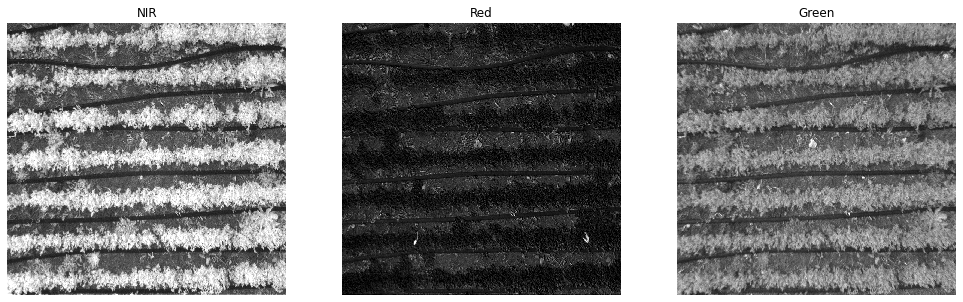

In [24]:
refNIR, refR, refG =[np.median(cal_plate['20210416'][400:500, 200:300][i]) for i in range(3)]
image_ref['20210416'] = images['20210416'] / [refNIR, refR, refG]
image_ref['20210416'] = np.where(image_ref['20210416'] > 1, 1, image_ref['20210416'])

fig, ax = plt.subplots(1, 3, figsize=(17, 5))
ax.flatten()
for n, band in enumerate(['NIR', 'Red', 'Green']):
    sns.heatmap(
        image_ref['20210416'][:,:,n], 
        cmap='binary_r', 
        ax=ax[n], 
        cbar= n == 3, 
        yticklabels=False, 
        xticklabels=False, 
        vmin=0, 
        vmax=1,
    )
    ax[n].set_title(band)
# fig.tight_layout(rect=[0, 0, .9, 1])

Text(0.5, 1.0, 'Plot false color composite')

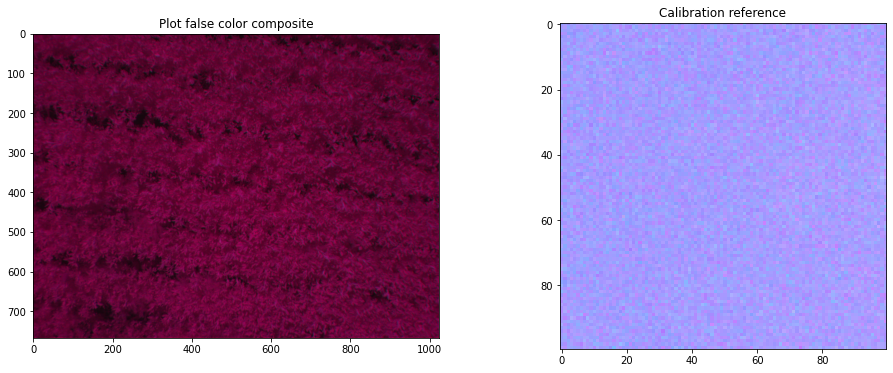

In [25]:
matrix = [
    ['R', -.89, -.89, 2.78, 1.],
    ['G', 3.68, -1.34, -1.34, .86],
    ['B', -1.34, 3.68, -1.34, .96]
]
images['20210514'] = create_image('Training_raw_images/20210514.RAW', matrix)
cal_plate['20210514'] = create_image('Training_raw_images/20210514_cal.RAW', matrix)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax.flatten()
ax[0].imshow(Image.fromarray(images['20210514']))
ax[1].imshow(Image.fromarray(cal_plate['20210514'][300:400, 400:500]))
ax[1].set_title('Calibration reference')
ax[0].set_title('Plot false color composite')

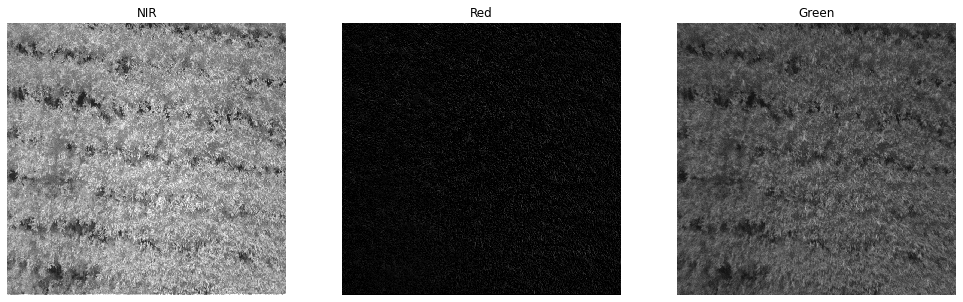

In [26]:
refNIR, refR, refG =[np.median(cal_plate['20210514'][300:400, 400:500][i]) for i in range(3)]
image_ref['20210514'] = images['20210514'] / [refNIR, refR, refG]
image_ref['20210514'] = np.where(image_ref['20210514'] > 1, 1, image_ref['20210514'])

fig, ax = plt.subplots(1, 3, figsize=(17, 5))
ax.flatten()

for n, band in enumerate(['NIR', 'Red', 'Green']):
    sns.heatmap(
        image_ref['20210514'][:,:,n], 
        cmap='binary_r', 
        ax=ax[n], 
        cbar=False, 
        yticklabels=False, 
        xticklabels=False, 
        vmin=0, 
        vmax=1
    )
    ax[n].set_title(band)

Text(0.5, 1.0, 'Plot false color composite')

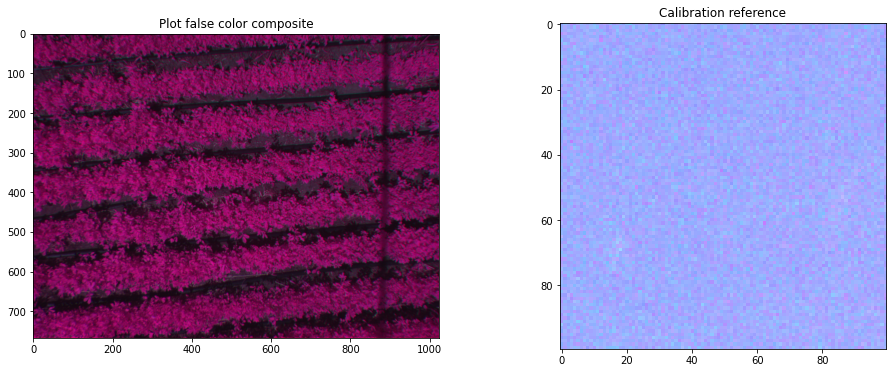

In [27]:
matrix = [
    ['R', -.89, -.89, 2.78, .95],
    ['G', 3.76, -1.38, -1.38, .86],
    ['B', -1.33, 3.66, -1.33, 1.]
]
images['20210723'] = create_image('Training_raw_images/20210723.RAW', matrix)
cal_plate['20210723'] = create_image('Training_raw_images/20210723_cal.RAW', matrix)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax.flatten()
ax[0].imshow(Image.fromarray(images['20210723']))
ax[1].imshow(Image.fromarray(cal_plate['20210723'][300:400, 400:500]))
ax[1].set_title('Calibration reference')
ax[0].set_title('Plot false color composite')

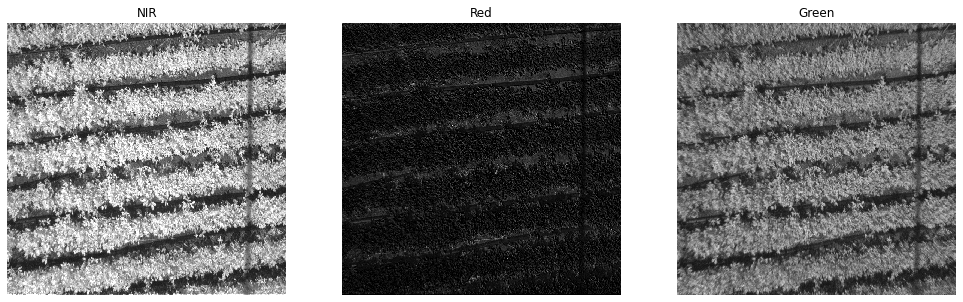

In [28]:
refNIR, refR, refG =[np.median(cal_plate['20210723'][300:400, 400:500][i]) for i in range(3)]
image_ref['20210723'] = images['20210723'] / [refNIR, refR, refG]
image_ref['20210723'] = np.where(image_ref['20210723'] > 1, 1, image_ref['20210723'])

fig, ax = plt.subplots(1, 3, figsize=(17, 5))
ax.flatten()

for n, band in enumerate(['NIR', 'Red', 'Green']):
    sns.heatmap(
        image_ref['20210723'][:,:,n], 
        cmap='binary_r', 
        ax=ax[n], 
        cbar=False, 
        yticklabels=False, 
        xticklabels=False, 
        vmin=0, 
        vmax=1
    )
    ax[n].set_title(band)

Text(0.5, 1.0, 'Plot false color composite')

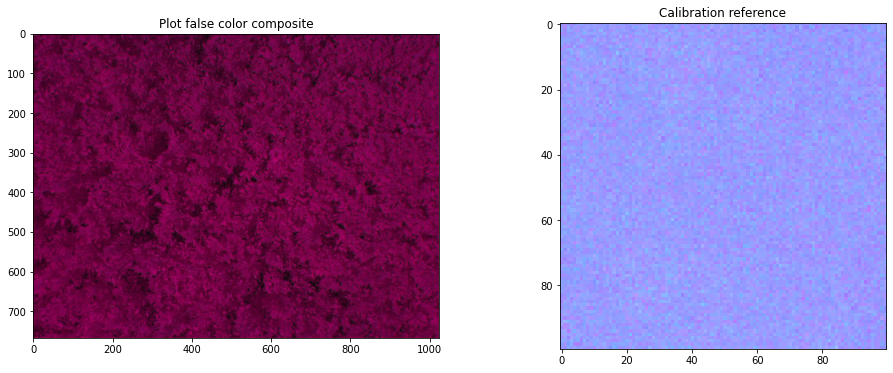

In [29]:
matrix = [
    ['R', -.88, -.88, 2.76, .91],
    ['G', 3.84, -1.42, -1.42, .85],
    ['B', -1.33, 3.66, -1.33, 1.]
]
images['20210813'] = create_image('Training_raw_images/20210813.RAW', matrix)
cal_plate['20210813'] = create_image('Training_raw_images/20210813_cal.RAW', matrix)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax.flatten()
ax[0].imshow(Image.fromarray(images['20210813']))
ax[1].imshow(Image.fromarray(cal_plate['20210813'][300:400, 400:500]))
ax[1].set_title('Calibration reference')
ax[0].set_title('Plot false color composite')

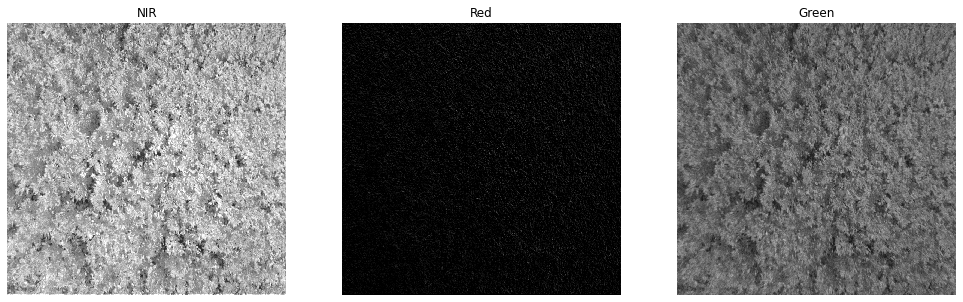

In [30]:
refNIR, refR, refG =[np.median(cal_plate['20210813'][300:400, 400:500][i]) for i in range(3)]
image_ref['20210813'] = images['20210813'] / [refNIR, refR, refG]
image_ref['20210813'] = np.where(image_ref['20210813'] > 1, 1, image_ref['20210813'])

fig, ax = plt.subplots(1, 3, figsize=(17, 5))
ax.flatten()

for n, band in enumerate(['NIR', 'Red', 'Green']):
    sns.heatmap(
        image_ref['20210813'][:,:,n], 
        cmap='binary_r', 
        ax=ax[n], 
        cbar=False, 
        yticklabels=False, 
        xticklabels=False, 
        vmin=0, 
        vmax=1
    )
    ax[n].set_title(band)

In [33]:
for name, image in images.items():
    im = Image.fromarray(image)
    im.save(f"{name}.TIF")

### Training Images

In [53]:
masks = {
    key: Image.open(f'Segmented/{key}_mask.tiff').getchannel('G')
    for key in images.keys() 
}

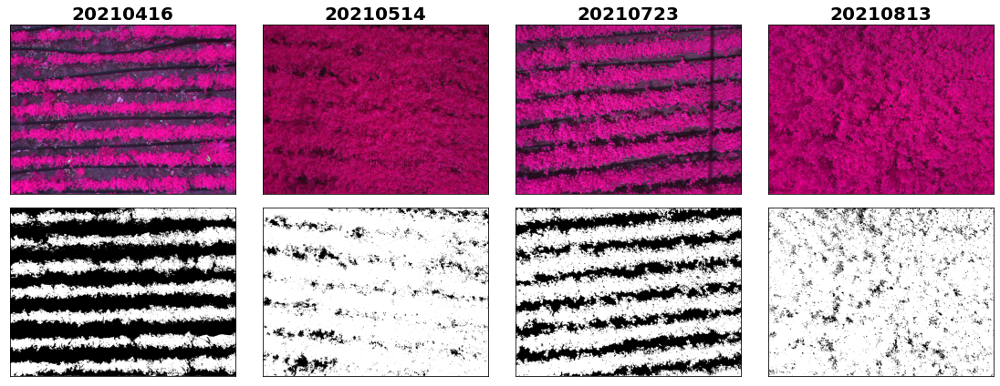

In [76]:
fig, ax = plt.subplots(2, 4, figsize=(16, 6))
for n, image in enumerate(images.keys()):
    ax[0][n].imshow(Image.fromarray((image_ref[image]*255).astype(np.uint8)))
    ax[1][n].imshow(masks[image], cmap='binary_r')
    ax[0][n].set_title(image, fontweight='bold', fontsize=20)
    ax[0][n].set_xticks([]); ax[0][n].set_yticks([])
    ax[1][n].set_xticks([]); ax[1][n].set_yticks([])
    plt.tight_layout()

In [78]:
with open('images_ref.pickle', 'wb') as handle:
    pickle.dump(image_ref, handle, protocol=pickle.HIGHEST_PROTOCOL)

{'20210416': array([[[0.21238938, 0.21958457, 0.39880952],
         [0.24778761, 0.16617211, 0.38095238],
         [0.24778761, 0.16617211, 0.375     ],
         ...,
         [0.65486726, 0.        , 0.36309524],
         [0.51327434, 0.0652819 , 0.36309524],
         [0.35988201, 0.17804154, 0.45238095]],
 
        [[0.20648968, 0.21364985, 0.375     ],
         [0.25958702, 0.17804154, 0.3452381 ],
         [0.26548673, 0.14243323, 0.3452381 ],
         ...,
         [0.66076696, 0.        , 0.41666667],
         [0.57817109, 0.        , 0.39285714],
         [0.43067847, 0.18397626, 0.39880952]],
 
        [[0.25958702, 0.20771513, 0.30357143],
         [0.36578171, 0.10089021, 0.33333333],
         [0.35988201, 0.11869436, 0.32142857],
         ...,
         [0.64896755, 0.02967359, 0.41666667],
         [0.5840708 , 0.0652819 , 0.38095238],
         [0.41297935, 0.23738872, 0.39880952]],
 
        ...,
 
        [[0.99705015, 0.04747774, 0.73809524],
         [1.        , 0.07715